<h3>Assignment 7 (Midsem)</h3>

In [102]:
import pandas as pd
import numpy as np
import plotly.express as px
from scipy.stats import kurtosis,skew
# import statsmodels.api as sm
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns

In [103]:
df = pd.read_csv("e7-htr-currernt.csv")

In [104]:
current = list(df["HT R Phase Current"])
timestamp = list(df["Timestamp"])
days = []
for i in timestamp:
    k = i[:2]
    days.append(k)

In [105]:
day_hash = np.zeros(len(days))
day_hash[0] = 1
current_date = days[0]
index = 1
for k in range(0, len(days)):
    temp = days[k]
    if temp != current_date:
        index += 1
        current_date = temp
        day_hash[k] += index
    else:
        day_hash[k] = index

df["Day No."] = day_hash
print(df)

              Timestamp  HT R Phase Current  Day No.
0      23-12-2018 05:30                0.00      1.0
1      23-12-2018 05:35                0.00      1.0
2      23-12-2018 05:40                0.00      1.0
3      23-12-2018 05:45                0.00      1.0
4      23-12-2018 05:50                0.00      1.0
5      23-12-2018 05:55                0.00      1.0
6      23-12-2018 06:00                0.00      1.0
7      23-12-2018 06:05                0.00      1.0
8      23-12-2018 06:10                0.00      1.0
9      23-12-2018 06:15                0.00      1.0
10     23-12-2018 06:20                0.00      1.0
11     23-12-2018 06:25                0.00      1.0
12     23-12-2018 06:30                0.00      1.0
13     23-12-2018 06:35                0.00      1.0
14     23-12-2018 06:40                0.73      1.0
15     23-12-2018 06:45                0.00      1.0
16     23-12-2018 06:50                0.00      1.0
17     23-12-2018 06:55                0.00   

In [106]:
overall_avg = np.mean(df["HT R Phase Current"])
# print(overall_avg)
Mean, Error, Std_dev, Median = [], [], [], []
Daily_readings = []
for i in range(1, 286):
    __ = df.loc[df["Day No."] == i]
    readings = __["HT R Phase Current"]
    Daily_readings.append(readings)
    mean = np.mean(readings)
    Mean.append(mean)
    # print(mean)
    error = overall_avg - mean
    Error.append(error)
    std_dev = np.std(readings)
    Std_dev.append(std_dev)
    median = np.median(readings)
    Median.append(median)
    print(f"Day {i}: Overall Mean = {overall_avg}, Mean = {mean}, Median = {median}, Error = {error}, Standard Deviation = {std_dev}.")

Day 1: Overall Mean = 16.912767417957564, Mean = 18.279009009009005, Median = 0.1, Error = -1.3662415910514412, Standard Deviation = 25.055921903641067.
Day 2: Overall Mean = 16.912767417957564, Mean = 10.687777777777779, Median = 0.1, Error = 6.2249896401797855, Standard Deviation = 19.593634699977763.
Day 3: Overall Mean = 16.912767417957564, Mean = 21.503611111111113, Median = 0.1, Error = -4.590843693153548, Standard Deviation = 27.659036299972744.
Day 4: Overall Mean = 16.912767417957564, Mean = 17.451354166666665, Median = 0.1, Error = -0.5385867487091005, Standard Deviation = 24.114771030362036.
Day 5: Overall Mean = 16.912767417957564, Mean = 15.338749999999997, Median = 0.14, Error = 1.5740174179575668, Standard Deviation = 22.7660027469995.
Day 6: Overall Mean = 16.912767417957564, Mean = 13.578159722222223, Median = 0.09, Error = 3.3346076957353414, Standard Deviation = 25.331256310458738.
Day 7: Overall Mean = 16.912767417957564, Mean = 23.915416666666665, Median = 0.17, Er

In [107]:
Days = np.arange(1,286)
labels = ['Day', 'Mean', 'Error', 'Standard Deviation', 'Median']
data = {'Day':Days, 'Mean': Mean, 'Error': Error, 'Standard Deviation': Std_dev, 'Median': Median}
Daily_data = pd.DataFrame(data)
print(Daily_data)

     Day       Mean      Error  Standard Deviation  Median
0      1  18.279009  -1.366242           25.055922   0.100
1      2  10.687778   6.224990           19.593635   0.100
2      3  21.503611  -4.590844           27.659036   0.100
3      4  17.451354  -0.538587           24.114771   0.100
4      5  15.338750   1.574017           22.766003   0.140
5      6  13.578160   3.334608           25.331256   0.090
6      7  23.915417  -7.002649           30.318242   0.170
7      8  23.764306  -6.851538           30.253630   0.170
8      9  25.476076  -8.563309           31.945404   0.160
9     10  25.304549  -8.391781           31.896807   0.100
10    11  11.767153   5.145615           24.858535   0.090
11    12   0.000000  16.912767            0.000000   0.000
12    13   0.000000  16.912767            0.000000   0.000
13    14   0.000000  16.912767            0.000000   0.000
14    15  18.742292  -1.829524           25.183021   0.100
15    16   5.554826  11.357941           16.062261   0.0

In [108]:
day_classification = np.zeros(285, dtype="str")
___ = Daily_data.loc[Daily_data["Mean"] == 0.0]
Missing_days = ___["Day"]
miss = np.array(Missing_days)
miss = miss.reshape(1, len(Missing_days))
print(f"Number of missing days are {len(Missing_days)} and they are: {miss}")
for i in Missing_days:
    day_classification[i - 1] = "M"
print(day_classification)

Number of missing days are 38 and they are: [[ 12  13  14  17  18  19  20  21  22  23  24  25  26  27  28  29  30  60
   61  62  63  64  65  66  67  68  76  98 183 184 185 210 232 244 245 246
  276 285]]
['' '' '' '' '' '' '' '' '' '' '' 'M' 'M' 'M' '' '' 'M' 'M' 'M' 'M' 'M'
 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' 'M' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' 'M' 'M' 'M' 'M' 'M'
 'M' 'M' 'M' 'M' '' '' '' '' '' '' '' 'M' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' 'M' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' 'M'
 'M' 'M' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 '' '' 'M' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' '' ''
 'M' '' '' '' '' '' '' '' '' '' '' '' 'M' 'M' 'M' '' '' '' ''

In [109]:
interval = 5
df["Moving Average"] = df["HT R Phase Current"].rolling(window = interval).mean()
# print(df["HT R Phase Current"])
for i in range(0, interval - 1):
    df.at[i,'Moving Average'] = 0

print(df)

              Timestamp  HT R Phase Current  Day No.  Moving Average
0      23-12-2018 05:30                0.00      1.0           0.000
1      23-12-2018 05:35                0.00      1.0           0.000
2      23-12-2018 05:40                0.00      1.0           0.000
3      23-12-2018 05:45                0.00      1.0           0.000
4      23-12-2018 05:50                0.00      1.0           0.000
5      23-12-2018 05:55                0.00      1.0           0.000
6      23-12-2018 06:00                0.00      1.0           0.000
7      23-12-2018 06:05                0.00      1.0           0.000
8      23-12-2018 06:10                0.00      1.0           0.000
9      23-12-2018 06:15                0.00      1.0           0.000
10     23-12-2018 06:20                0.00      1.0           0.000
11     23-12-2018 06:25                0.00      1.0           0.000
12     23-12-2018 06:30                0.00      1.0           0.000
13     23-12-2018 06:35           

     Day       Mean      Error  Standard Deviation  Median  \
284  285   0.000000  16.912767            0.000000   0.000   
27    28   0.000000  16.912767            0.000000   0.000   
28    29   0.000000  16.912767            0.000000   0.000   
29    30   0.000000  16.912767            0.000000   0.000   
30    31   0.021042  16.891726            0.038256   0.000   
245  246   0.000000  16.912767            0.000000   0.000   
244  245   0.000000  16.912767            0.000000   0.000   
243  244   0.000000  16.912767            0.000000   0.000   
231  232   0.000000  16.912767            0.000000   0.000   
59    60   0.000000  16.912767            0.000000   0.000   
60    61   0.000000  16.912767            0.000000   0.000   
26    27   0.000000  16.912767            0.000000   0.000   
61    62   0.000000  16.912767            0.000000   0.000   
63    64   0.000000  16.912767            0.000000   0.000   
64    65   0.000000  16.912767            0.000000   0.000   
65    66

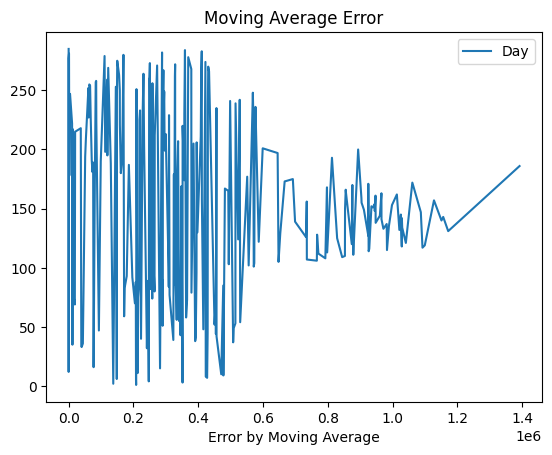

In [110]:
def one_outlier(a,b,c):
    values_within_range = 0

    if a <= 0.3:
        values_within_range += 1

    if b <= 0.3:
        values_within_range += 1

    if c <= 0.3:
        values_within_range += 1
    if values_within_range == 1:
        return True
    else:
        return False

error_ma = []
for i in range(0, len(Days)):
    day = df.loc[df["Day No."] == i + 1]
    curr = day["HT R Phase Current"]
    length = len(curr)
    m_avg = day["Moving Average"]
    error_sq = 0
    for j in range(length):
        if not one_outlier(m_avg.iloc[j-2],m_avg.iloc[j-1],m_avg.iloc[j]):
            error_sq += (curr.iloc[i]-m_avg.iloc[j])**2
    error_ma.append(int(error_sq))
Daily_data['Error by Moving Average'] = error_ma
Sorted_dailydata = Daily_data.sort_values(by='Error by Moving Average')
print(Sorted_dailydata)
Sorted_dailydata.plot(kind='line', x = 'Error by Moving Average', y = 'Day', title='Moving Average Error')
plt.show()

In [111]:
fig = px.line(df,y = "HT R Phase Current",animation_frame = "Day No.")
fig1 = px.line(df,y = "Moving Average",animation_frame = "Day No.")
fig.show()
fig1.show()

In [112]:
for i in range(0, len(Days) - 1):
    if Sorted_dailydata['Error by Moving Average'].iloc[i + 1] - Sorted_dailydata['Error by Moving Average'].iloc[i] > 30000:
        break
print(Sorted_dailydata.iloc[i])

Day                           201.000000
Mean                           23.866910
Error                          -6.954142
Standard Deviation             29.823244
Median                          2.320000
Error by Moving Average    599020.000000
Name: 200, dtype: float64


In [113]:
good_data = Sorted_dailydata[(Sorted_dailydata['Error by Moving Average'] < 599021) & (Sorted_dailydata['Error by Moving Average'] > 0.3)]
good_data = good_data.sort_values(by = 'Day')
print(good_data)

     Day       Mean      Error  Standard Deviation  Median  \
0      1  18.279009  -1.366242           25.055922   0.100   
1      2  10.687778   6.224990           19.593635   0.100   
2      3  21.503611  -4.590844           27.659036   0.100   
3      4  17.451354  -0.538587           24.114771   0.100   
4      5  15.338750   1.574017           22.766003   0.140   
5      6  13.578160   3.334608           25.331256   0.090   
6      7  23.915417  -7.002649           30.318242   0.170   
7      8  23.764306  -6.851538           30.253630   0.170   
8      9  25.476076  -8.563309           31.945404   0.160   
9     10  25.304549  -8.391781           31.896807   0.100   
10    11  11.767153   5.145615           24.858535   0.090   
14    15  18.742292  -1.829524           25.183021   0.100   
15    16   5.554826  11.357941           16.062261   0.000   
31    32  15.397292   1.515476           25.578417   0.090   
32    33   3.457465  13.455302           11.897334   0.000   
33    34